In [1]:
import os
import cv2
import numpy as np
import pprint
import shutil
import socket
import os
import json
import glob
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300


## Extract data

In [2]:
hostname = socket.gethostname()
if hostname == "HAITI":
    repo_folder = "C:\\Users\\xin\\OneDrive - bwstaff\\xin\\yolov7"
    dataset_folder = "D:\\xin\\datasets\\CV\\ECP"
if hostname == "BALI":
    repo_folder = "/home//OneDrive/xin/yolov7"
    dataset_folder = "/storage/xin/datasets/CV/ECP"

In [3]:
# show what a json file looks like
file = os.path.join(dataset_folder ,"day","labels_original", "val","amsterdam", "amsterdam_01122.json")
with open(file) as f:
    data = json.load(f)
pprint.pprint(data['children'])

[{'children': [],
  'identity': 'bicycle-group',
  'tags': [],
  'x0': 1508,
  'x1': 1571,
  'y0': 614,
  'y1': 651},
 {'Orient': 350.0,
  'children': [],
  'identity': 'pedestrian',
  'tags': [],
  'x0': 1410,
  'x1': 1431,
  'y0': 593,
  'y1': 640},
 {'children': [],
  'identity': 'bicycle-group',
  'tags': [],
  'x0': 1316,
  'x1': 1373,
  'y0': 597,
  'y1': 625},
 {'children': [],
  'identity': 'person-group-far-away',
  'tags': [],
  'x0': 1257,
  'x1': 1264,
  'y0': 592,
  'y1': 612},
 {'children': [],
  'identity': 'pedestrian',
  'tags': ['occluded>40'],
  'x0': 1237,
  'x1': 1255,
  'y0': 592,
  'y1': 630},
 {'children': [],
  'identity': 'person-group-far-away',
  'tags': [],
  'x0': 1214,
  'x1': 1225,
  'y0': 589,
  'y1': 623},
 {'children': [{'Orient': 176.0,
                'children': [],
                'identity': 'bicycle',
                'tags': [],
                'x0': 1203,
                'x1': 1216,
                'y0': 602,
                'y1': 624}],
  'ide

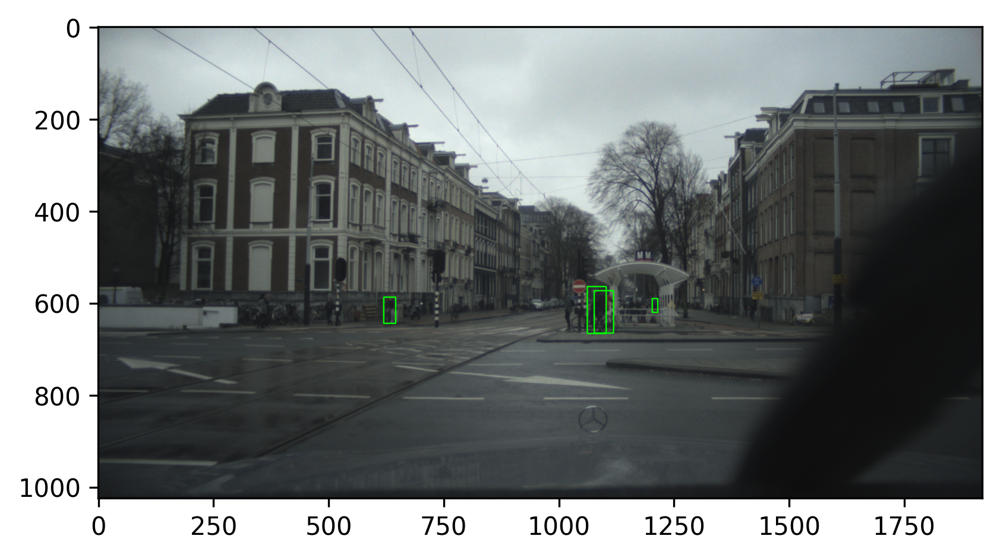

In [4]:
# ECP originally records top-left and bottom-right coordinates
img_path = os.path.join(dataset_folder ,"day","images", "val","amsterdam", "amsterdam_01122.png")
img = cv2.imread(img_path)
for d in data['children']:
    if d['identity'] == 'rider':
        cv2.rectangle(img, (d['x0'], d['y0']), (d['x1'], d['y1']), (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

## EDA

### check unique identities

In [5]:
from collections import defaultdict
identities = defaultdict(int)
for file in glob.glob(os.path.join(dataset_folder ,"*","labels_original", "val","*", "*.json")):
    with open(file) as f:
        data = json.load(f)
        for d in data['children']:
            identities[d['identity']]+=1
identities

defaultdict(int,
            {'person-group-far-away': 11041,
             'pedestrian': 26236,
             'bicycle-group': 2592,
             'rider': 2173,
             'scooter-group': 1616,
             'motorbike-group': 640,
             'rider+vehicle-group-far-away': 288,
             'buggy-group': 157,
             'tricycle-group': 9,
             'wheelchair-group': 7,
             'bicycle': 8,
             'motorbike': 2})

### check "identities"

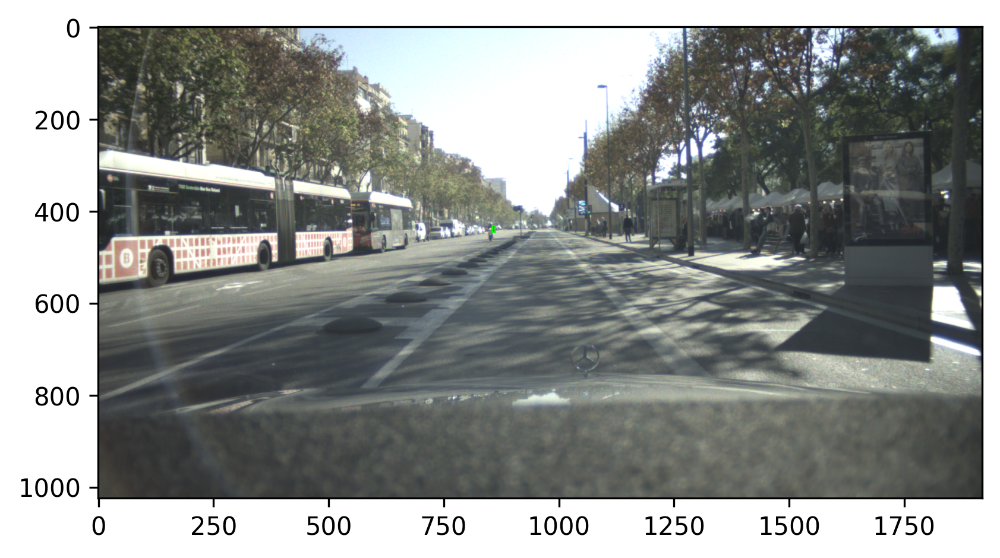

In [6]:
group_to_check = 'rider+vehicle-group-far-away'
files = []
for file in glob.glob(os.path.join(dataset_folder ,"day","labels_original", "val","*", "*.json")):
    with open(file) as f:
        data = json.load(f)
        for d in data['children']:
            if d['identity'] == group_to_check:
                files.append(file)

json_path = files[10]
img_path = json_path.replace("labels_original", "images").replace("json", "png")

with open(json_path) as f:
    data = json.load(f)

img = cv2.imread(img_path)
for d in data['children']:
    if d['identity'] == group_to_check:
        cv2.rectangle(img, (d['x0'], d['y0']), (d['x1'], d['y1']), (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))


In [7]:
data['children']

[{'tags': [],
  'x0': 475,
  'y1': 463,
  'y0': 411,
  'x1': 496,
  'children': [],
  'identity': 'person-group-far-away'},
 {'tags': [],
  'x0': 507,
  'y1': 453,
  'y0': 409,
  'x1': 524,
  'children': [],
  'identity': 'person-group-far-away'},
 {'tags': [],
  'x0': 856,
  'y1': 446,
  'y0': 432,
  'x1': 862,
  'children': [],
  'identity': 'rider+vehicle-group-far-away'},
 {'tags': ['occluded>40'],
  'x0': 1078,
  'y1': 449,
  'y0': 415,
  'x1': 1092,
  'children': [],
  'identity': 'pedestrian'},
 {'tags': [],
  'x0': 1090,
  'children': [],
  'y1': 459,
  'y0': 412,
  'x1': 1106,
  'Orient': 40.0,
  'identity': 'pedestrian'},
 {'tags': [],
  'x0': 1177,
  'y1': 449,
  'y0': 412,
  'x1': 1188,
  'children': [],
  'identity': 'pedestrian'},
 {'tags': [],
  'x0': 1140,
  'children': [],
  'y1': 469,
  'y0': 407,
  'x1': 1163,
  'Orient': 170.3,
  'identity': 'pedestrian'},
 {'tags': ['occluded>40'],
  'x0': 1249,
  'children': [],
  'y1': 485,
  'y0': 416,
  'x1': 1280,
  'Orient': 

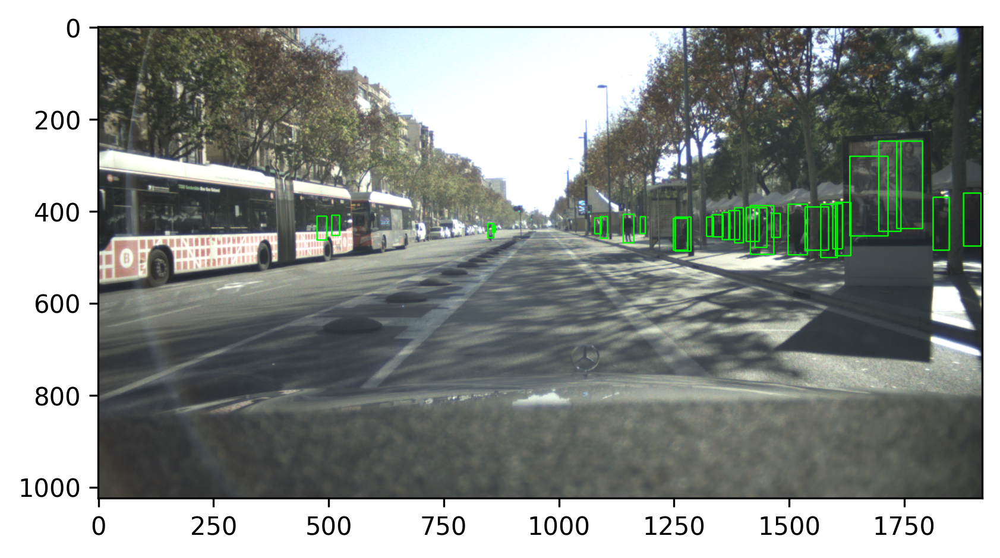

In [8]:
# original
img = cv2.imread(img_path)
for d in data['children']:
    cv2.rectangle(img, (d['x0'], d['y0']), (d['x1'], d['y1']), (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [9]:
# identities should be classified as person
identities_person = ['pedestrian', 'rider', 'person-group-far-away','rider+vehicle-group-far-away']

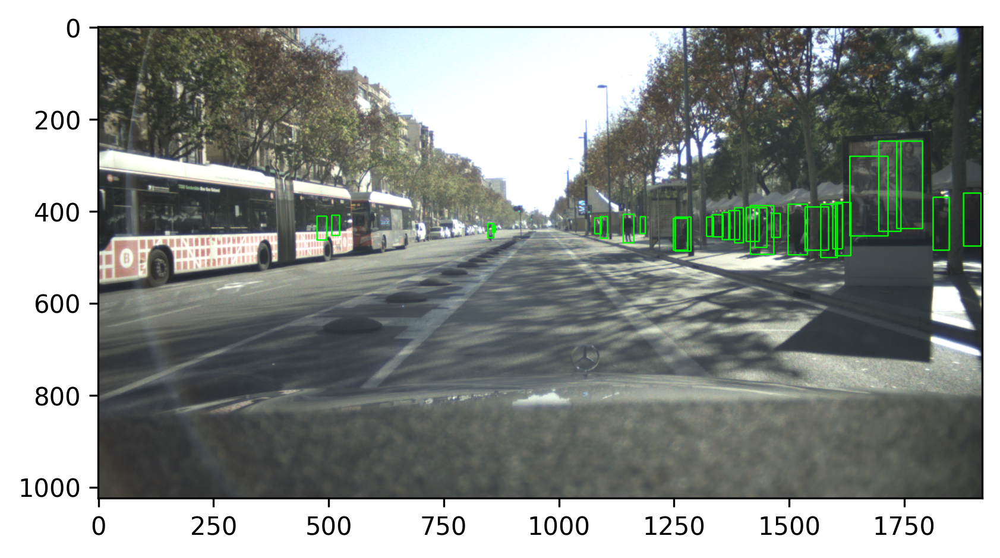

In [10]:
# group to classify
img = cv2.imread(img_path)
for d in data['children']:
    if d['identity'] in identities_person:
        cv2.rectangle(img, (d['x0'], d['y0']), (d['x1'], d['y1']), (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

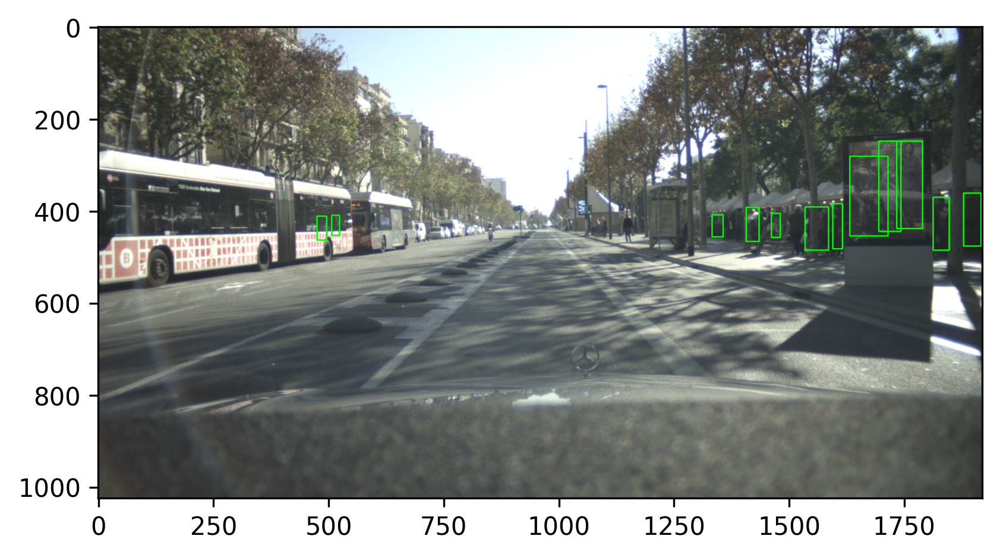

In [11]:
# 'person-group-far-away' includes persons in posters and reflections
img = cv2.imread(img_path)
for d in data['children']:
    if d['identity'] == 'person-group-far-away':
        cv2.rectangle(img, (d['x0'], d['y0']), (d['x1'], d['y1']), (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

### xyxy -> xywh

['1 0.252865 0.426758 0.010938 0.050781',
 '1 0.26849 0.420898 0.008854 0.042969',
 '1 0.447396 0.428711 0.003125 0.013672',
 '1 0.565104 0.421875 0.007292 0.033203',
 '1 0.571875 0.425293 0.008333 0.045898',
 '1 0.615885 0.42041 0.005729 0.036133',
 '1 0.59974 0.427734 0.011979 0.060547',
 '1 0.658594 0.439941 0.016146 0.067383',
 '1 0.661458 0.439453 0.017708 0.072266',
 '1 0.691927 0.423828 0.007812 0.041016',
 '1 0.700521 0.421875 0.0125 0.046875',
 '1 0.709896 0.422363 0.008333 0.057617',
 '1 0.719271 0.42041 0.0125 0.061523',
 '1 0.72474 0.420898 0.009896 0.074219',
 '1 0.740104 0.418945 0.014583 0.072266',
 '1 0.749479 0.425781 0.013542 0.083984',
 '1 0.750781 0.430664 0.026562 0.103516',
 '1 0.791146 0.429688 0.021875 0.107422',
 '1 0.81276 0.427734 0.026563 0.091797',
 '1 0.836198 0.422852 0.010938 0.095703',
 '1 0.826562 0.432617 0.01875 0.113281',
 '1 0.842448 0.428711 0.017188 0.113281',
 '1 0.953385 0.41748 0.018229 0.112305',
 '1 0.988542 0.408691 0.019792 0.112305',
 '1 

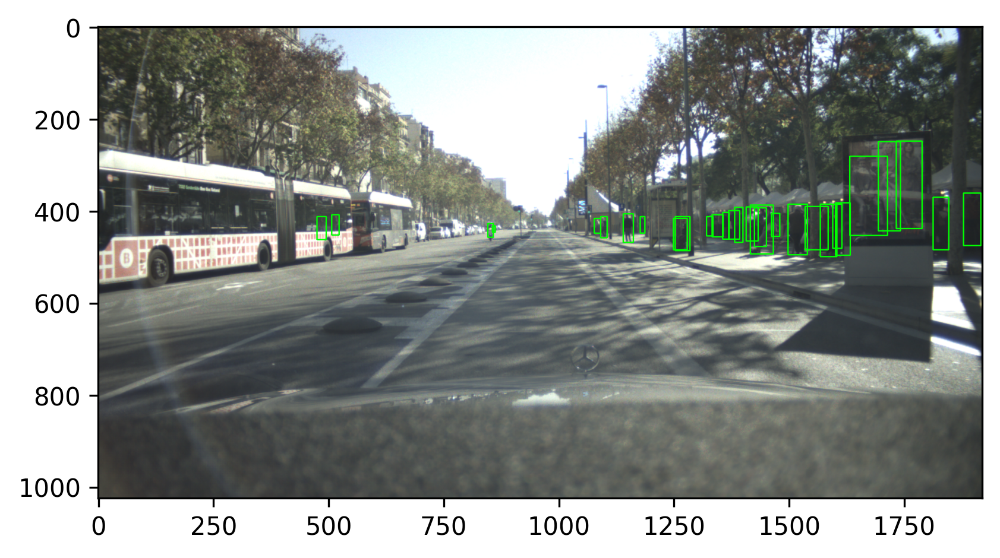

In [12]:
width = data['imagewidth']
height = data['imageheight']

annotations = []
for d in data['children']:
    if d['identity'] in identities_person:
        x0 = float(d['x0'])/width
        y0 = float(d['y0'])/height
        x1 = float(d['x1'])/width
        y1 = float(d['y1'])/height

        w = x1 - x0
        h = y1 - y0
        xc = (x0 + x1)/2
        yc = (y0 + y1)/2

        # keep 6 digits as in coco
        w = round(w,6)
        h = round(h,6)
        xc = round(xc,6)
        yc = round(yc,6)

        s = f'1 {xc} {yc} {w} {h}'
        annotations.append(s)

pprint.pprint(annotations)

# show image
img = cv2.imread(img_path)
for anno in annotations:
    anno = anno.split()
    xc = int(width * float(anno[1]))
    yc = int(height * float(anno[2]))
    w = int(width * float(anno[3]))
    h = int(height * float(anno[4]))
    cv2.rectangle(img, (xc-w//2,yc-h//2),(xc+w//2,yc+h//2), color = (0, 255, 0),thickness = 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

## preprocessing


### show target format

In [ ]:
with open('/storage/xin/datasets/CV/coco2017/labels/val2017/000000190140.txt') as f:
    val2017_000000190140 = f.readlines()
val2017_000000190140

['16 0.617617 0.534393 0.123797 0.344065\n',
 '8 0.424547 0.629206 0.840062 0.498879\n',
 '0 0.355500 0.520362 0.215406 0.377313\n',
 '8 0.500000 0.184264 1.000000 0.364042\n']

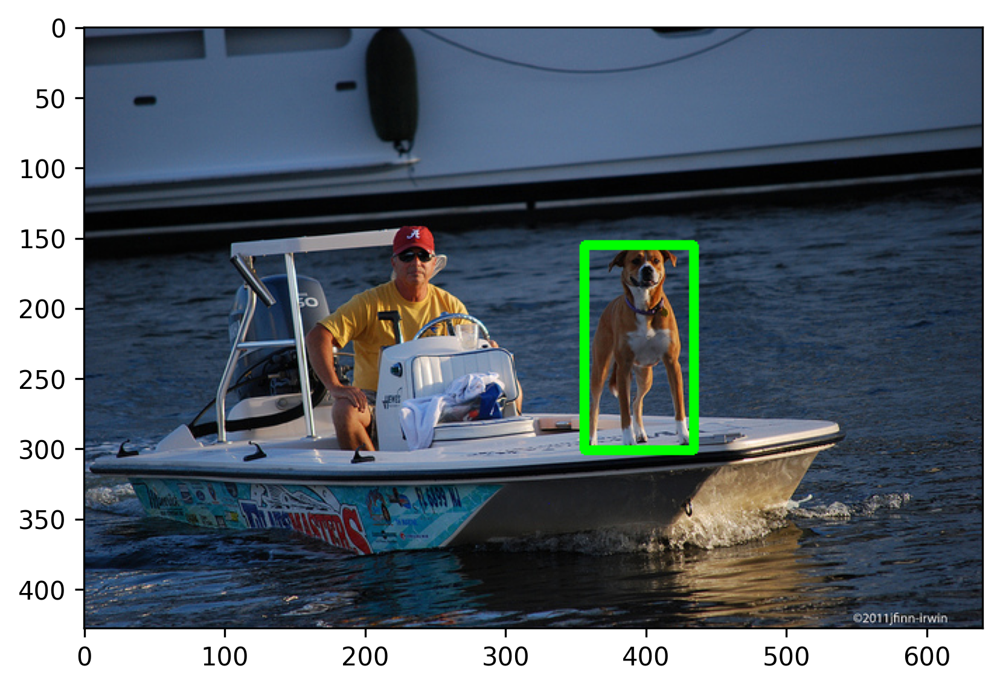

In [ ]:
obj = val2017_000000190140[0].replace("\n","").split(' ')
img_path = os.path.join('/storage/xin/datasets/CV/coco2017/images/val2017', "000000190140.jpg")
img = cv2.imread(img_path)
height, width, channels = img.shape
xc = int(width * float(obj[1]))
yc = int(height * float(obj[2]))
w = int(width * float(obj[3]))
h = int(height * float(obj[4]))
cv2.rectangle(img, (xc-w//2,yc-h//2),(xc+w//2,yc+h//2), color = (0, 255, 0),thickness = 5)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

## Rearange the data

In [9]:
# identities should be classified as person
identities_person = ['pedestrian', 'rider', 'person-group-far-away','rider+vehicle-group-far-away']

train_list = []
val_list = []
test_list = []

for file in glob.glob(os.path.join(dataset_folder ,"*","labels_original", "*", "*", "*.json")):
    label_path = file.replace("labels_original", "labels").replace('json','txt')
    img_path = label_path.replace('labels','images').replace('txt','png')
    os.makedirs(os.path.dirname(label_path), exist_ok=True)
    
    with open(file) as f:
        data = json.load(f)

        width = data['imagewidth']
        height = data['imageheight']

        annotations = []
        for d in data['children']:
            if d['identity'] in identities_person:
                x0 = float(d['x0'])/width
                y0 = float(d['y0'])/height
                x1 = float(d['x1'])/width
                y1 = float(d['y1'])/height

                w = x1 - x0
                h = y1 - y0
                xc = (x0 + x1)/2
                yc = (y0 + y1)/2

                # keep 6 digits as in coco
                w = round(w,6)
                h = round(h,6)
                xc = round(xc,6)
                yc = round(yc,6)

                s = f'0 {xc} {yc} {w} {h}'
                annotations.append(s)
        
        if annotations: # ignore images with empty annotations
            # summarize img_path
            if 'train' in img_path:
                train_list.append(img_path)
            elif 'val' in img_path:
                val_list.append(img_path)

            # save label in new format
            with open(label_path, 'w') as f:
                for anno in annotations:
                    f.write(anno + '\n')

# write all train img file locations 
with open(os.path.join(dataset_folder, 'train.txt'), 'w') as f:
    for img_path in train_list:
        f.write(img_path + '\n')      

# write all val img file locations to new txt file 
with open(os.path.join(dataset_folder, 'val.txt'), 'w') as f:
    for img_path in val_list:
        f.write(img_path + '\n')

# write all val img file locations to new txt file
for file in glob.glob(os.path.join(dataset_folder ,"*","images", "test", "*", "*.png")):
    test_list.append(file)
with open(os.path.join(dataset_folder, 'test.txt'), 'w') as f:
    for img_path in test_list:
        f.write(img_path + '\n')  